# Домашняя работа 5

Поработаем с датасетом о пользователях кредитных карт.

Мы хотим кластеризовать пользователей на категории для того, чтобы по-разному настраивать рекламу на них.

## Easy

Выдвинуть гипотезу по каким признакам нужно кластеризовать пользователей. Провести кластеризацию одним любым методом, проанализировать "на глаз" насколько хорошо получилось, можно ли как-то проинтерпретировать кластеры?

In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings(action='ignore')

In [2]:
cc = pd.read_csv('../data/CC GENERAL.csv')
cc

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


**Признаки**

- CUST_ID : Identification of Credit Card holder (Categorical)
- BALANCE : Balance amount left in their account to make purchases (
- BALANCE_FREQUENCY : How frequently the Balance is updated, score between 0 and 1 (1 = frequently updated, 0 = not frequently updated)
- PURCHASES : Amount of purchases made from account
- ONEOFF_PURCHASES : Maximum purchase amount done in one-go
- INSTALLMENTS_PURCHASES : Amount of purchase done in installment
- CASH_ADVANCE : Cash in advance given by the user
- PURCHASES_FREQUENCY : How frequently the Purchases are being made, score between 0 and 1 (1 = frequently purchased, 0 = not frequently purchased)
- ONEOFFPURCHASESFREQUENCY : How frequently Purchases are happening in one-go (1 = frequently purchased, 0 = not frequently purchased)
- PURCHASESINSTALLMENTSFREQUENCY : How frequently purchases in installments are being done (1 = frequently done, 0 = not frequently done)
- CASHADVANCEFREQUENCY : How frequently the cash in advance being paid
- CASHADVANCETRX : Number of Transactions made with "Cash in Advanced"
- PURCHASES_TRX : Numbe of purchase transactions made
- CREDIT_LIMIT : Limit of Credit Card for user
- PAYMENTS : Amount of Payment done by user
- MINIMUM_PAYMENTS : Minimum amount of payments made by user
- PRCFULLPAYMENT : Percent of full payment paid by user
- TENURE : Tenure of credit card service for user

***Гипотеза***: для выделения кластеров пользователей в зависимости от их типа покупательского поведения могут использоваться признаки, связанные с суммами покупок (PURCHASES, ONEOFF_PURCHASES, INSTALLMENTS_PURCHASES) и частотой покупок (PURCHASES_FREQUENCY, ONEOFF_PURCHASES_FREQUENCY, PURCHASES_INSTALLMENTS_FREQUENCY)

In [3]:
cc.dropna(inplace = True, axis = 1)
cc

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,201.802084,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,4103.032597,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,622.066742,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,0.000000,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,678.334763,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,325.594462,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,275.861322,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,81.270775,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,52.549959,0.250000,6


In [4]:
columns = ['PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY']
df = cc[columns]
mean = df.mean()
std = df.std()
df = (df - mean)/ std

In [5]:
from sklearn.cluster import KMeans

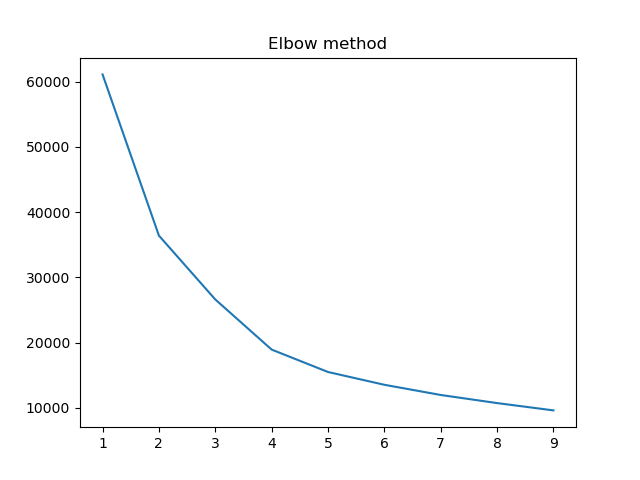

In [6]:
# def distance_by_n(x, n):
#     model = KMeans(n_clusters=n)
#     model.fit(x)
#     return model.inertia_

# distances = [distance_by_n(df, n) for n in range(1, 10)]
# plt.plot(range(1, 10), distances)
# plt.title('Elbow method')
from IPython.display import Image
Image("../data/elbow_method.png")

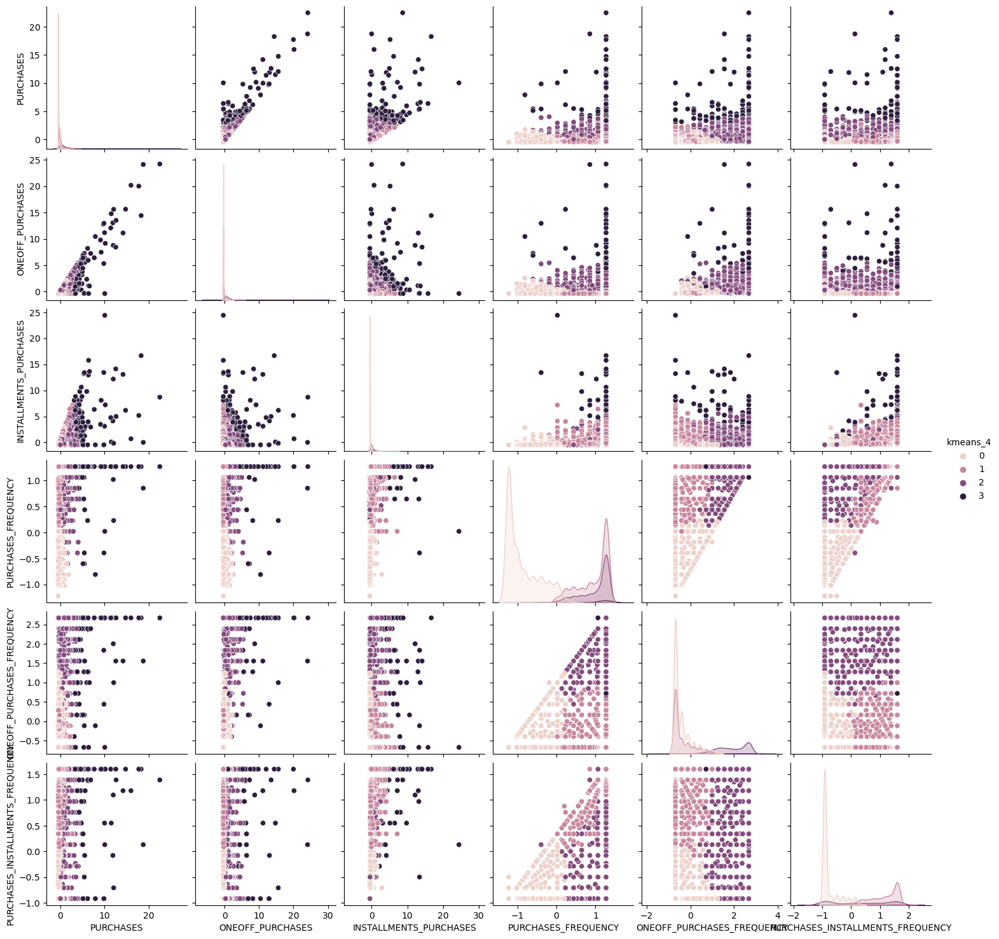

In [7]:
model = KMeans(n_clusters=4, random_state=42) # по картинке - 4 кластера оптимально
model_labels = model.fit_predict(df)
df['kmeans_4'] = model_labels
sns.pairplot(df, hue = 'kmeans_4')

Хотим представить данные в пространстве меньшей размерности, сохраняя при этом относительные расстояния между точками, можно использовать pca или t-SNE, но так как t-SNE пытается сохранить локальную структуру (кластер) данных,будем использовать его

In [8]:
from sklearn.manifold import TSNE

In [9]:
tsne = TSNE(n_components=2)
data = tsne.fit_transform(df)

<Axes: >

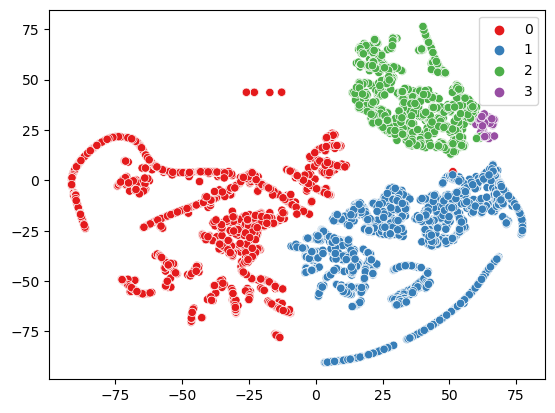

In [10]:
sns.scatterplot(x=data[:, 0], y=data[:, 1], hue=model_labels, palette="Set1")

кластеры хорошо разделяются и формируют группы, "на глаз" отстутствуют наложения 

In [11]:
centroids = model.cluster_centers_
centroids

array([[-0.35478044, -0.23983167, -0.39819493, -0.85501704, -0.40596151,
        -0.75536719],
       [-0.03505163, -0.24091511,  0.35989051,  0.95019338, -0.38043675,
         1.13991753],
       [ 0.78732847,  0.85316631,  0.29388649,  1.0052705 ,  1.92029488,
         0.32849061],
       [ 6.47705793,  5.50368024,  5.20083659,  1.07834493,  1.73059843,
         1.0634191 ]])

In [12]:
centroids_df = pd.DataFrame(centroids, columns=columns)
centroids_df = (centroids_df * std) + mean
centroids_df

,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY
0,245.168608,194.343688,50.964788,0.147172,0.081345,0.064218
1,928.312297,192.545293,736.530351,0.871730,0.088960,0.817495
2,2685.438230,2008.597828,676.840402,0.893837,0.775351,0.494995
3,14842.312100,9727.929700,5114.382400,0.923167,0.718758,0.787091


Кластер 0:
   - самый низкий общий объем покупок (около 245.16) среди всех кластеров
   - однократные покупки и покупки в рассрочку совсем невелики
   - частота покупок низкая

Кластер 1:
   - меньший объем покупок (около 928.59) по сравнению с кластерами 2 и 3
   - однократные покупки значительно меньше, чем покупки в рассрочку, и очень редкие
   - частота покупок высокая (около 0.87), с высокой частотой покупок в рассрочку (от них основной вклад в покупки)

Кластер 2:
   - средний общий объем покупок (примерно 2685.44)
   - значительные суммы покупок однократных и в рассрочку
   - частота покупок довольно высокая (около 0.89), включая как однократные, так и покупки в рассрочку
   - по отдельности частота однократных покупок и частота покупок в рассрочку также высокие

Кластер 3:
   - очень высокий общий объем покупок (примерно 14842.31), что значительно превышает другие кластеры
   - однократные покупки и покупки в рассрочку значительны
   - частота покупок очень высокая (чуть больше 0.92), включая как однократные, так и покупки в рассрочку

На основе характеристик центроидов можно предположить, что кластер 3 представляет покупателей с высокой частотой покупок и крупными покупками, кластер 0 представляет сдержанных потребителей с низкими объемами покупок, другие кластеры могут указывать на разные стили покупок и предпочтения (тчо-то среднее)

## Normal

Провести кластеризацию несколькими методами. Объяснить какой результат лучше и почему. Проинтерпретировать кластеры в лучшем разбиении.

Попробуем провести кластеризацию на всем наборе данных без id и без пропусков

In [13]:
full_df = cc.drop('CUST_ID', axis = 1)
full_df

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,201.802084,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,4103.032597,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,622.066742,0.000000,12
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,0.000000,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,678.334763,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,325.594462,0.500000,6
8946,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,275.861322,0.000000,6
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,81.270775,0.250000,6
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,52.549959,0.250000,6


Text(0.5, 1.0, 'Elbow method')

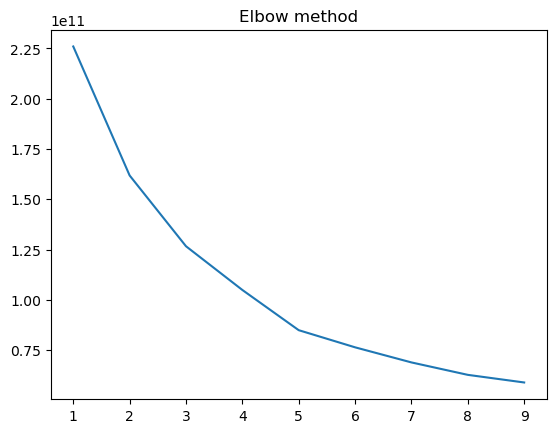

In [14]:
def distance_by_n(x, n):
    model = KMeans(n_clusters=n)
    model.fit(x)
    return model.inertia_

distances = [distance_by_n(full_df, n) for n in range(1, 10)]
plt.plot(range(1, 10), distances)
plt.title('Elbow method')

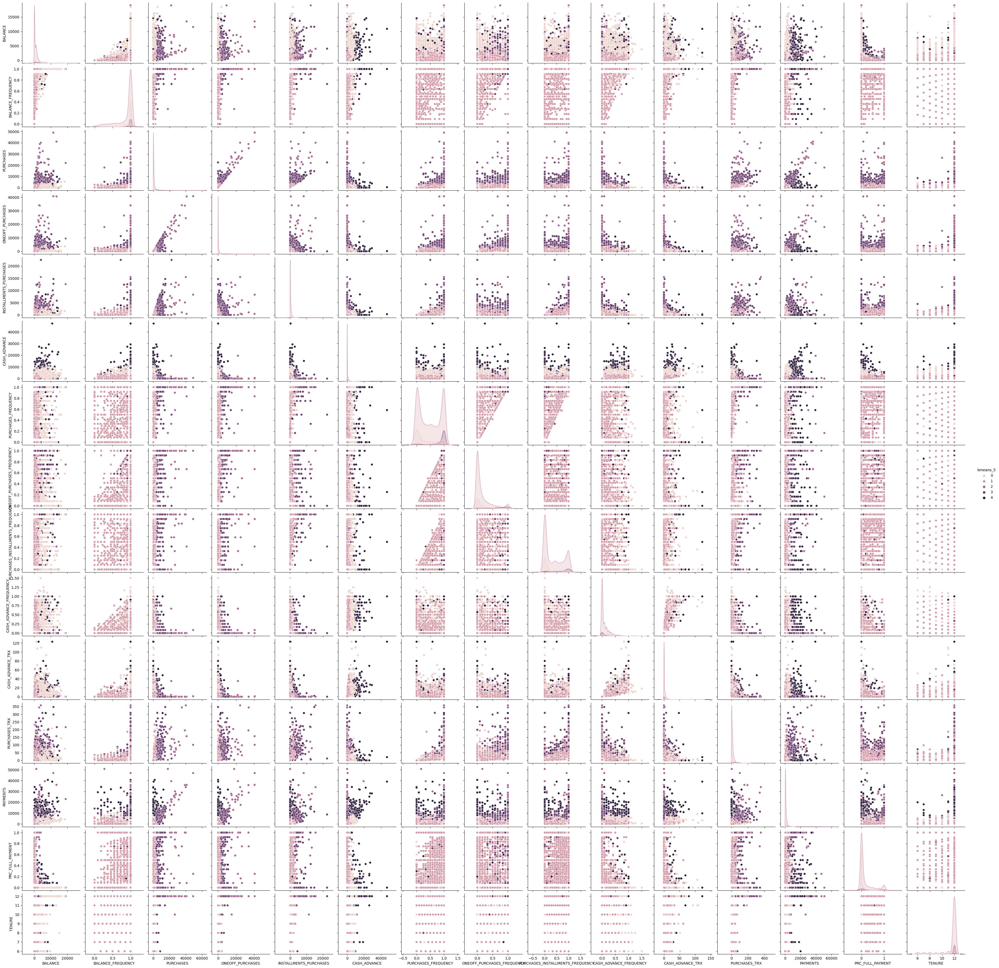

In [15]:
model = KMeans(n_clusters=5, random_state=42) # по картинке - 5 кластеров наиболее подходящее
model_labels = model.fit_predict(full_df)
full_df['kmeans_5'] = model_labels
sns.pairplot(full_df, hue = 'kmeans_5')

<Axes: >

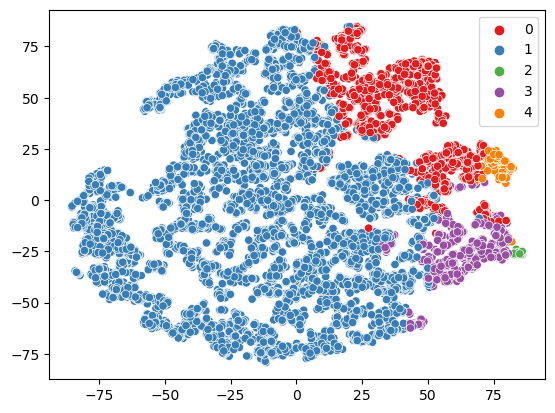

In [16]:
full_data = tsne.fit_transform(full_df)
sns.scatterplot(x=full_data[:, 0], y=full_data[:, 1], hue=model_labels, palette="Set1")

Много наложений и 'потерянных' точек (в других кластерах) и 2-й очень мал

In [17]:
from sklearn.cluster import DBSCAN

<Axes: >

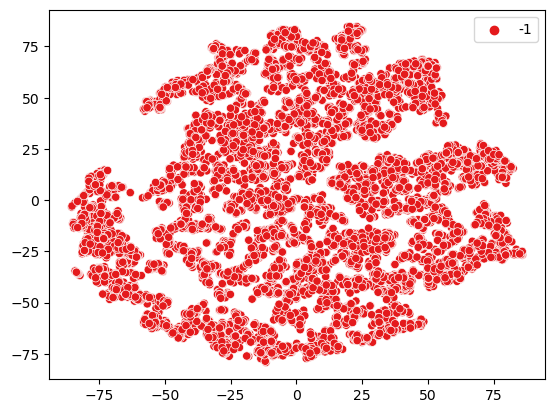

In [18]:
res = DBSCAN(eps=1, min_samples=10).fit_predict(full_df)
sns.scatterplot(x=full_data[:, 0], y=full_data[:, 1], hue=res, palette="Set1")

In [19]:
min_sampless = [5, 10, 15]

for eps in np.arange(0.5, 10.5, 0.5):
    for min_samples in min_sampless:
        clusters = DBSCAN(eps=eps, min_samples=min_samples).fit_predict(full_df)
        n_clusters = len(set(clusters)) 
        if n_clusters > 1:
            print(f'eps={eps}, min_samples={min_samples}, количество кластеров: {n_clusters}')

eps=6.5, min_samples=5, количество кластеров: 2
eps=7.0, min_samples=5, количество кластеров: 2
eps=7.5, min_samples=5, количество кластеров: 2
eps=8.0, min_samples=5, количество кластеров: 2
eps=8.5, min_samples=5, количество кластеров: 2
eps=9.0, min_samples=5, количество кластеров: 2
eps=9.5, min_samples=5, количество кластеров: 3
eps=10.0, min_samples=5, количество кластеров: 4


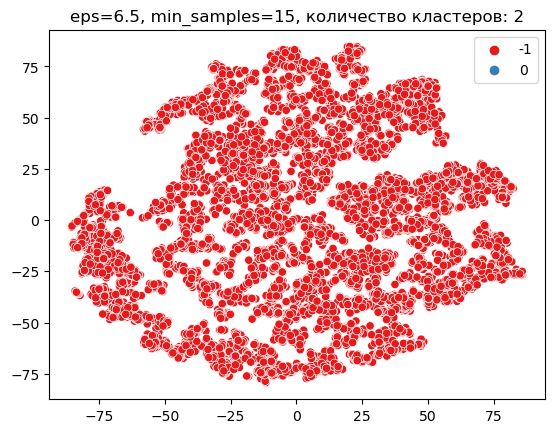

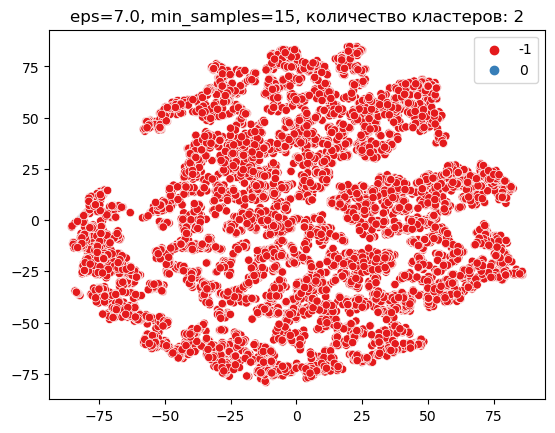

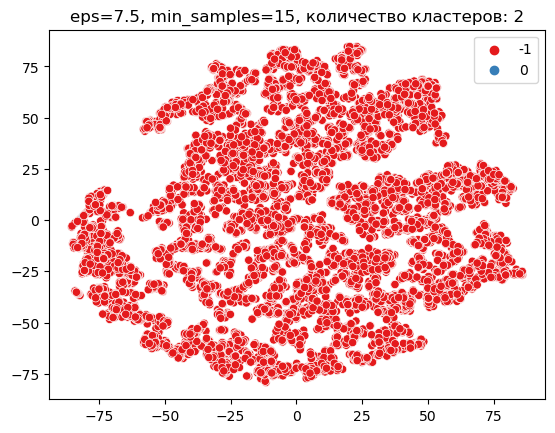

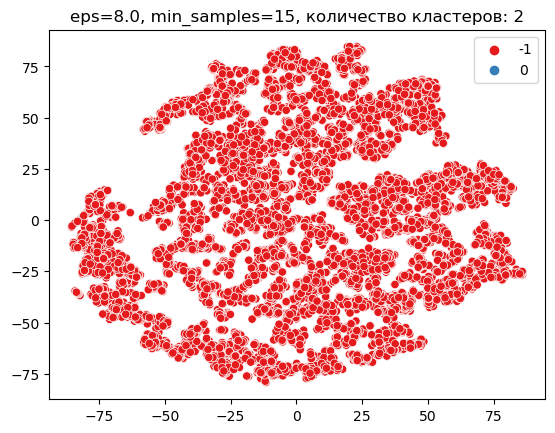

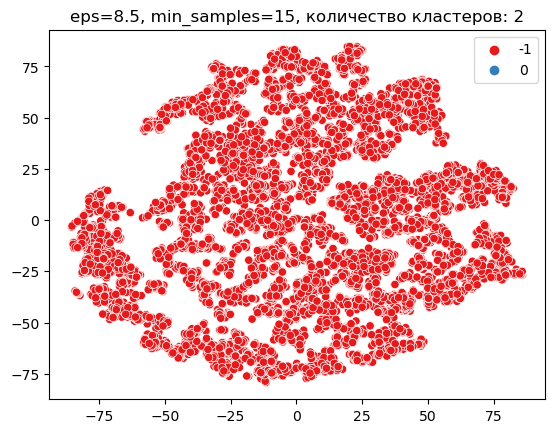

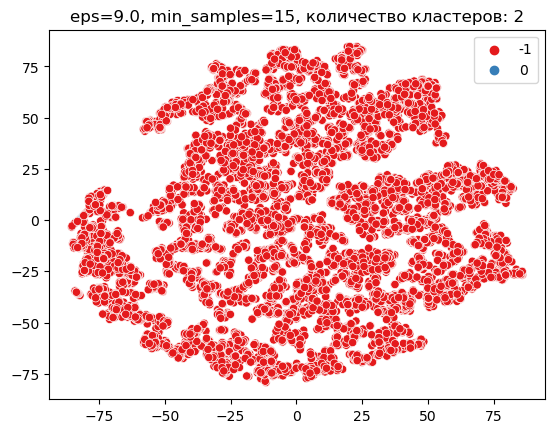

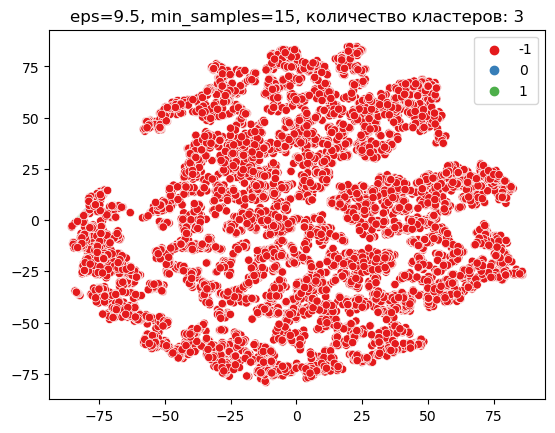

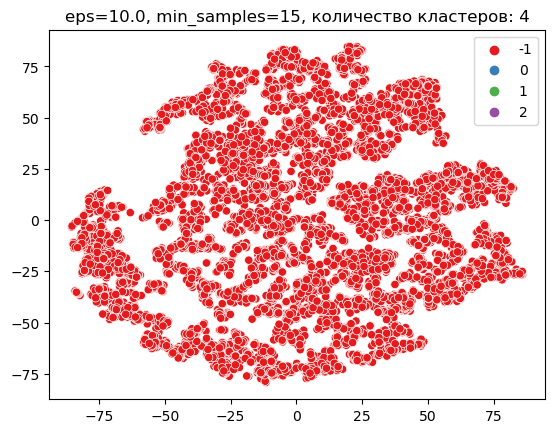

In [20]:
for eps in np.arange(6.5, 10.5, 0.5):
    clusters = DBSCAN(eps=eps, min_samples=5).fit_predict(full_df)
    n_clusters = len(set(clusters)) 
    plt.figure()
    sns.scatterplot(x=full_data[:, 0], y=full_data[:, 1], hue=clusters, palette="Set1")
    plt.title(f'eps={eps}, min_samples={min_samples}, количество кластеров: {n_clusters}')
    plt.show()


как-то грустно(

In [21]:
from sklearn.mixture import GaussianMixture

gmm = GaussianMixture(n_components=5, random_state=42) 
gmm.fit(full_df)
clusters = gmm.predict(full_df)

<Axes: >

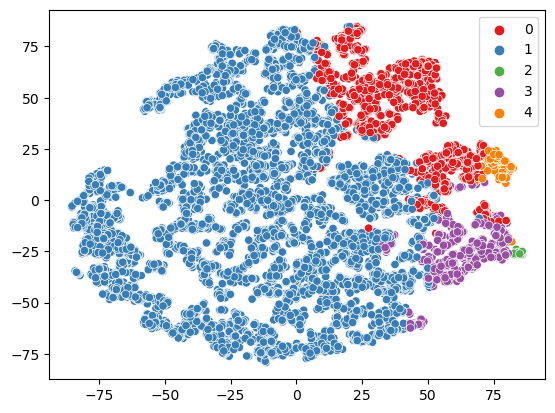

In [22]:
sns.scatterplot(x=full_data[:, 0], y=full_data[:, 1], hue=clusters, palette="Set1")

Много наложений и 'потерянных' точек (в других кластерах)

In [23]:
from sklearn.cluster import AgglomerativeClustering

agg = AgglomerativeClustering(n_clusters=2) 
clusters = agg.fit_predict(full_df)

<Axes: >

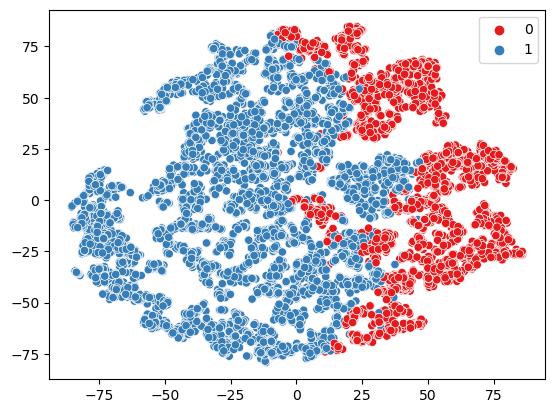

In [24]:
sns.scatterplot(x=full_data[:, 0], y=full_data[:, 1], hue=clusters, palette="Set1")

хорошее разбиение, но есть некоторые наложения

Итак, лучше всех справились AgglomerativeClustering и KMeans